<h1 style= "text-align:center;color: #0080ff">EMPRESA GASTRODATA</h1>
<p>Somos una pequeña empresa  (GastroData)  especializada en la recolección, procesamiento y análisis de datos de restaurantes. Actualmente, nos limitamos a recibir diferentes clientes únicamente de la provincia de La Habana, Cuba. A continuación, mostramos una gráfica en la que se puede observar la gramos de restaurantes por municipios que hemos analizado y de los cuales obtuvimos datos para satisfacer las peticiones de los clientes de este mes.</p>

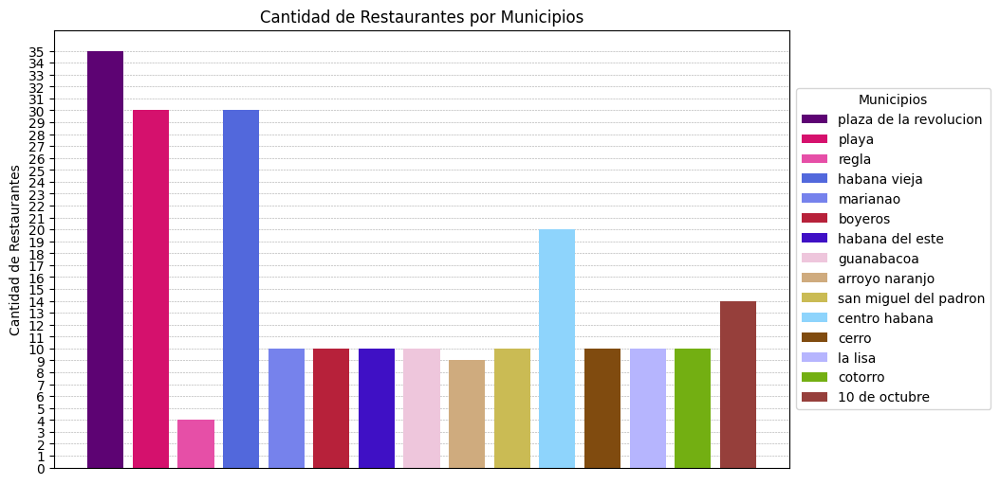

In [ ]:
import matplotlib.pyplot as plt
import os
import json
import random

ruta_carpeta = "json"
archivos_json = os.listdir(ruta_carpeta) 

gramos_restaurantes = {}
colors = {}

for i in archivos_json:
    with open(os.path.join(ruta_carpeta, i), "r", encoding="utf8") as f:
        datos = json.load(f)
        municipio = datos["municipality"].strip().lower() if "municipality" in datos and datos["municipality"] else None
        if municipio:
            if municipio not in gramos_restaurantes:
                gramos_restaurantes[municipio] = 1
                colors[municipio] = f'#{random.randint(0, 0xFFFFFF):06x}'
            else:
                gramos_restaurantes[municipio] += 1


municipios = list(gramos_restaurantes.keys())
gramos_restaurantes_valores = list(gramos_restaurantes.values())

plt.figure(figsize=(10, 6)) 
for i, (municipio, gramos) in enumerate(zip(municipios, gramos_restaurantes_valores)): 
    plt.bar(i, gramos, color=colors[municipio], label=municipio if municipio not in plt.gca().get_legend_handles_labels()[1] else "")
 
plt.xticks([])
plt.yticks(range(0, max(gramos_restaurantes_valores) + 1))
plt.ylabel('gramos de Restaurantes')
plt.title('gramos de Restaurantes por Municipios')
legend_title = "Municipios"
handles, labels = plt.gca().get_legend_handles_labels() 
plt.legend(handles, labels, title=legend_title, loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True, color='gray', linestyle='--', linewidth=0.4, alpha=0.7)
plt.gca().set_axisbelow(True)
plt.show()

El primer cliente del mes nos envió un correo electrónico solicitando ayuda para determinar la gramos mínima de masas de pizza que necesitaría para abastecer a los restaurantes en La Habana. Por ello, realizamos una recolección de datos de los restaurantes que venden pizzas en la capital, llegando a la conclusión de que la gramos aproximada de ellos ayudarían a establecer un aproximado de la gramos de bases de pizza necesarias para abastecerlos considerablemente, cuyos resultados se muestran en la siguiente gráfica.

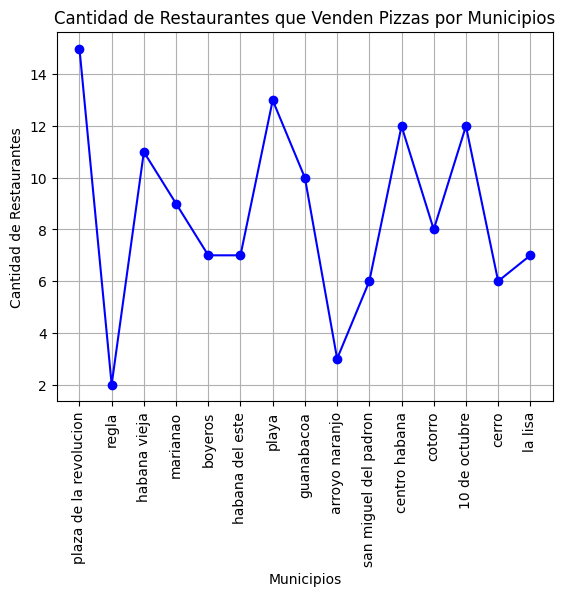

In [ ]:
import json
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import os

# lista de archivos JSON
ruta_carpeta = "json"
archivos_json = os.listdir(ruta_carpeta)

# diccionario para almacenar los restaurantes que venden pizzas por municipio
pizzas_por_municipios = {}

# Leer los menús desde cada archivo JSON y separar los restaurantes por localidad
for archivo in archivos_json:
    with open(os.path.join(ruta_carpeta,archivo),"r", encoding="utf8") as f:
        datos = json.load(f)
        municipio = datos.get('municipality')
        municipio = municipio.strip().lower() 
        pizzas = datos['menu'].get('pizzas') 
    #para verificar si el menú de pizzas no es null y tiene datos 
    if pizzas:
       if municipio not in pizzas_por_municipios:
          pizzas_por_municipios[municipio] = 0
       pizzas_por_municipios[municipio] += 1
    
municipios = list(pizzas_por_municipios.keys())
gramos_restaurantes = list(pizzas_por_municipios.values())

plt.plot(municipios, gramos_restaurantes, marker='o', linestyle='-', color='blue')
plt.xlabel('Municipios')
plt.ylabel('gramos de Restaurantes')
plt.title('gramos de Restaurantes que Venden Pizzas por Municipios')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

El siguiente cliente del mes se trata de un turista extranjero que venía de visita a La Habana por una semana y estaba interesado en degustar de todos los restaurantes posibles de la capital. El cliente deseaba probar un poco de cada plato fuerte, postres y bebidas, por lo que debía elegir un elemento de cada una de estas categorías con el precio mínimo, para que así el presupuesto del que nos habló (no tenemos permitido revelar esa información) fuera suficiente para su travesía por los restaurantes de la capital. De esta manera, podría visitar cada restaurante que ofrecía estas tres opciones.

In [ ]:
import os
import json
import pandas as pd
import my_library as ly

ruta_carpeta = 'json'
archivos_json = os.listdir(ruta_carpeta)
data = []

for archivo in archivos_json:
    with open(os.path.join(ruta_carpeta, archivo), "r", encoding="utf8") as f:
        datos = json.load(f)
        if 'menu' in datos and 'name' in datos:
            name = datos['name']
            valores = []

            if 'liquids' in datos['menu'] and datos['menu']['liquids'] is not None:
                liquids = datos['menu']['liquids']
                valores_liquids = ly.valor_num(liquids)
                valores_liquids.sort()
                if valores_liquids:
                    valores.append(valores_liquids[0])

            if 'desserts' in datos['menu'] and datos['menu']['desserts'] is not None:
                desserts = datos['menu']['desserts']
                valores_desserts = ly.valor_num(desserts)
                valores_desserts.sort()
                if valores_desserts:
                    valores.append(valores_desserts[0])

            if 'strong_dishes' in datos['menu'] and datos['menu']['strong_dishes'] is not None:
                strong_dishes = datos['menu']['strong_dishes']
                valores_strong_dishes = ly.valor_num(strong_dishes)
                valores_strong_dishes.sort()
                if valores_strong_dishes:
                    valores.append(valores_strong_dishes[0])

            if len(valores) == 3:
                suma = sum(valores)
                if datos['10%_of_the_service'] is True:
                    suma += ly.calcular_10_de_la_suma(suma)
                if datos['5%_of_the_service'] is True:
                    suma += ly.calcular_5_de_la_suma(suma)
                moneda = datos.get('type_of_currency', 'usd')
                if moneda == "usd":
                    suma_texto = f'{suma} dólares'
                else:
                    suma_texto = f'{suma} pesos'
                data.append([name, suma_texto])

df = pd.DataFrame(data, columns=['Nombre del Restaurante', 'Presupuesto Mínimo'])
df.to_csv('presupuesto_minimo.csv', index=False, encoding='utf-8-sig')
print(df)

    Nombre del Restaurante Presupuesto Mínimo
0     5 Esquinas trattoria       4600.0 pesos
1              7 de espada       3100.0 pesos
2          Altahabana_Club       1950.0 pesos
3             Al Campestre       2080.0 pesos
4                   Amalfi       5540.0 pesos
..                     ...                ...
96         Torre de Marfil       2310.0 pesos
97            El Vampirito       1100.0 pesos
98               VenaVento       2530.0 pesos
99              Villanueva       1400.0 pesos
100             Vita Nuova         2220 pesos

[101 rows x 2 columns]


El último trabajo del mes fue solicitado por un cliente que recientemente se había mudado a La Habana y no tenía mucho conocimiento sobre las calles y sitios de la capital. Este cliente deseaba visitar restaurantes en la capital, pero no conocía sus direcciones ni sabía cómo llegar. Por ello, le ofrecimos un mapa donde pudiera observar la ubicación de algunos de los restaurantes de la capital.


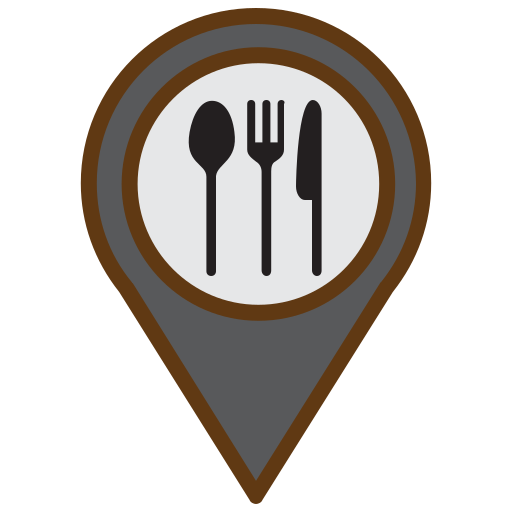
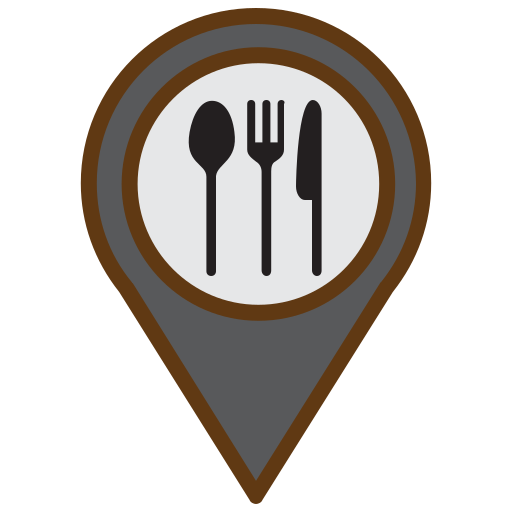
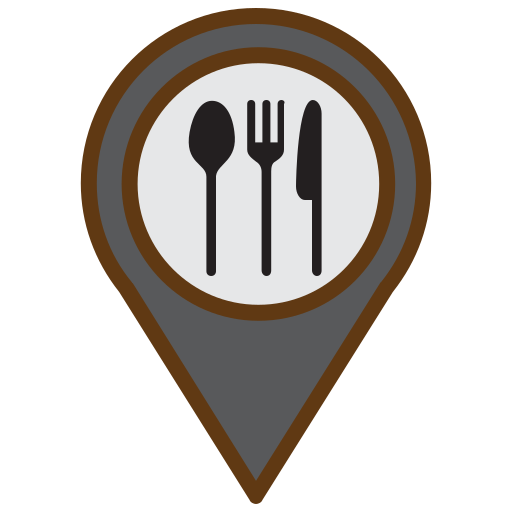
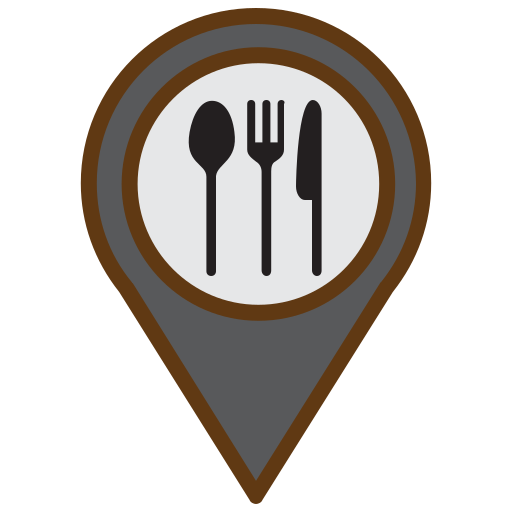
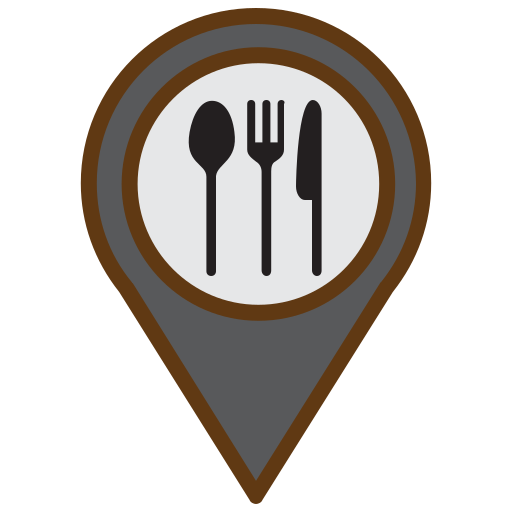
...
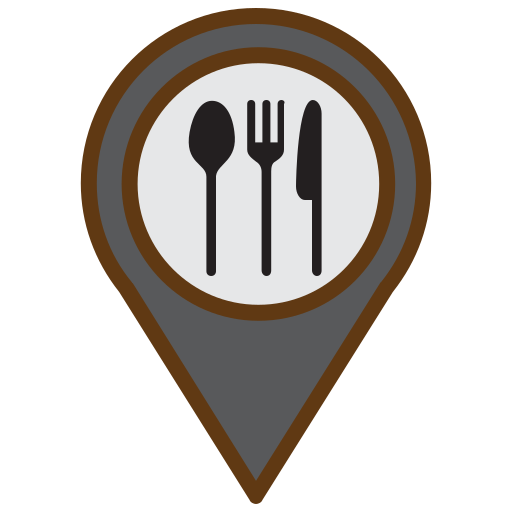
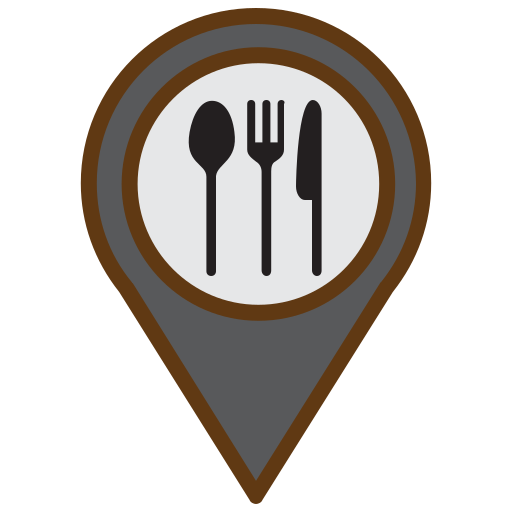
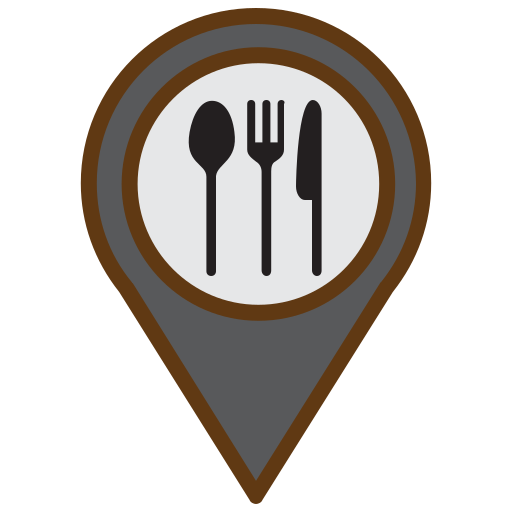
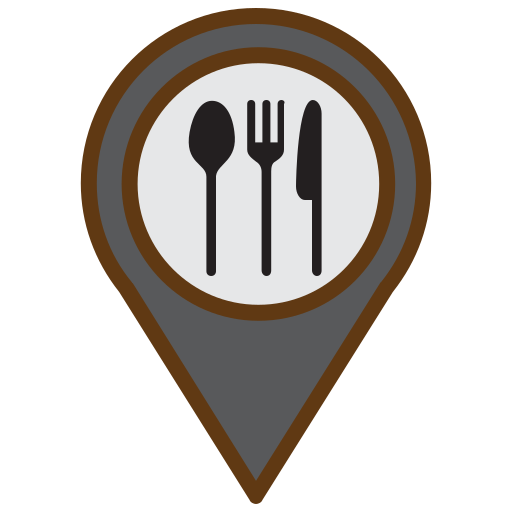
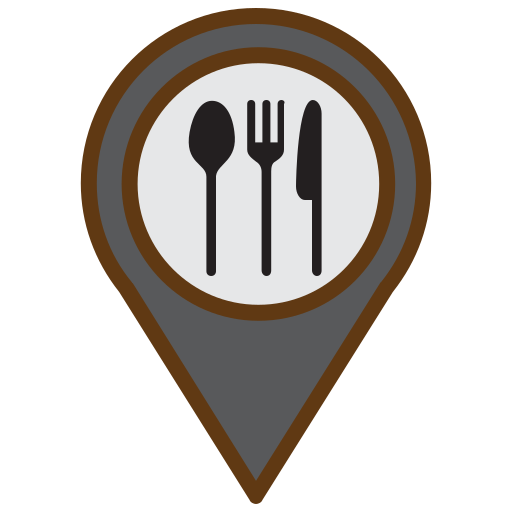

In [ ]:
import folium as fm
import json
import os

mapa = fm.Map(location = [23.075162, -82.358295],zoom_start=11)
archivos_json = os.listdir('json') 

for archivo in archivos_json:
    with open(os.path.join('json',archivo),"r", encoding="utf8") as f:
        datos = json.load(f)
        nombre = datos['name']
        if datos['location']['coordinates_latitude_length'] is not None:
            latitud, longitud = datos['location']['coordinates_latitude_length']
            icono = fm.CustomIcon(icon_image="icono.png",icon_size = (30,30))
            fm.Marker(location=[latitud,longitud],popup=nombre,icon=icono).add_to(mapa)

mapa

codigo donde el cliente escoge un plato del que desea saber sus aportes nutricionales, segun la gramos gramos del ingrediente principal (carne) que lleva el plato. hay cierta gramos de restaurantes que ofrecen la gramos de gramos de ingredientes que lleva su  plato, a estos restaurante le hicimos un estudio, de los aportes nutricionales que tiene cada uno de sus platos fuertes segun la gramos de gramos del ingrediente principa (carne) que posee, el cliente puede escoger el restaurante del que desea saber los aportes nutricionales de cada plato. 

Casa Mia:['Punta de res a la Duth', 'Arracera', 'Filete Tenderloing', 'T bone con papas asadas al romero y salsa de queso azul']
ChaChaCha:['Solomillo argentino', 'Entrecote de ternera']
Comida Criolla Ocho Vías:['Bistec de Higado', 'Higado Italiana', 'Bistec de Cerdo', 'Chuleta de Cerdo', 'Fricase de Cerdo', 'Masa Frita', 'Fricase de Carnero', 'Ropa Vieja', 'Langosta Grille', 'Langosta Enchilada']
El Farallon:['FILETE PESCADO GRILLE', 'FILETE DE PESCADO C/ J Y Q GRATINADO', 'FILETE DE PESCADO JOHN VILLE', 'CAMARÓN AL GUSTO (GRILLLE, ENCHILADO Y AL AJILLO)', 'PULPO AL GUSTO (GRILLLE, ENCHILADO Y AL AJILLO)', 'ROPA VIEJA', 'VACA FRITA', 'BISTEC DE CERDO GRILLE', 'MASA DE CERDO FRITA', 'PECHUGA DE POLLO GRILLE', 'FAJITAS DE POLLO SALTEADAS', 'BISTEC DE POLLO DESHUESADO', 'POLLO A LA BARBACOA', 'POLLO ASADO']
Heredia:['POLLO CHIFLADO(SIN HUESO)']
Lateral:['Solomillo', 'Lomo de cerdo', 'Chuleta cerdo (Arroz moro y tostones)']
Pasos Habaneros:['Pollo asado']
Cafe Versalles:['Chuleta de cerd

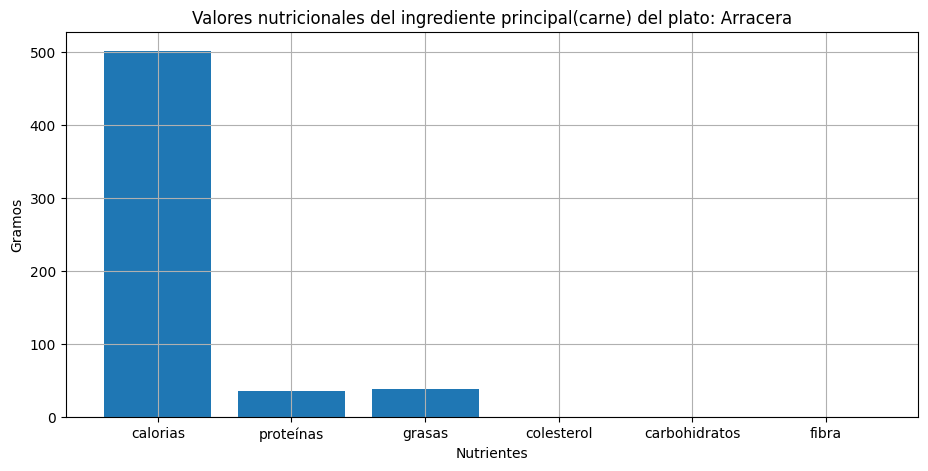

Valores nutricionales del ingrediente principal(carne) del plato T bone con papas asadas al romero y salsa de queso azul:
calorias: 1380.5
proteínas: 100.1
grasas: 104.5
colesterol: 0.54
carbohidratos: 2.58
fibra: 0.0


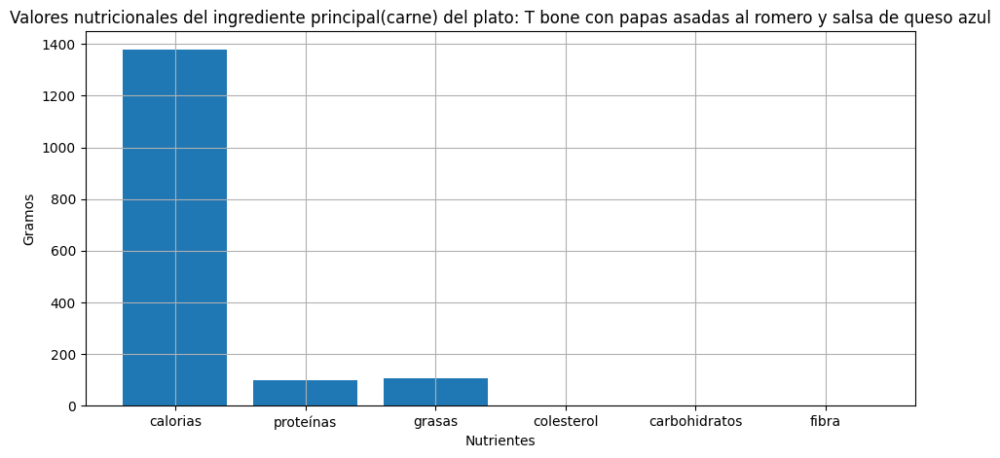

Valores nutricionales del ingrediente principal(carne) del plato Filete Tenderloing:
calorias: 552.2
proteínas: 40.04
grasas: 41.8
colesterol: 0.22
carbohidratos: 1.03
fibra: 0.0


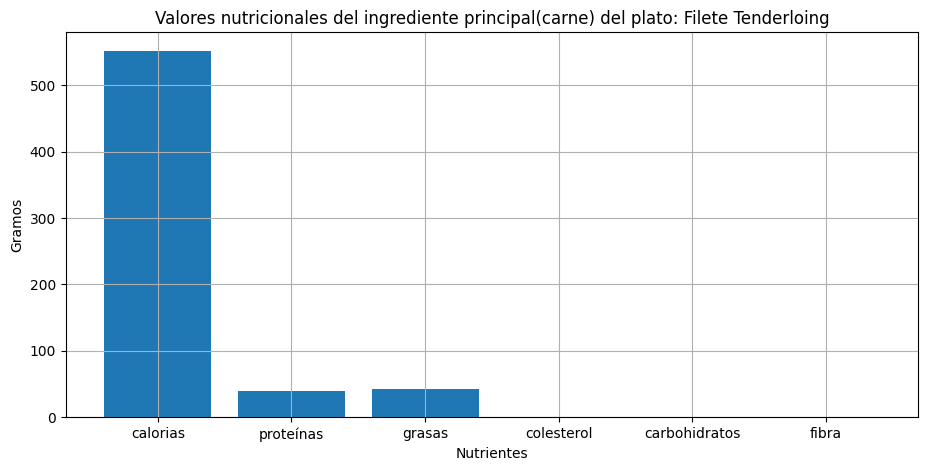

Valores nutricionales del ingrediente principal(carne) del plato Punta de res a la Duth:
calorias: 502.0
proteínas: 36.4
grasas: 38.0
colesterol: 0.2
carbohidratos: 0.94
fibra: 0.0


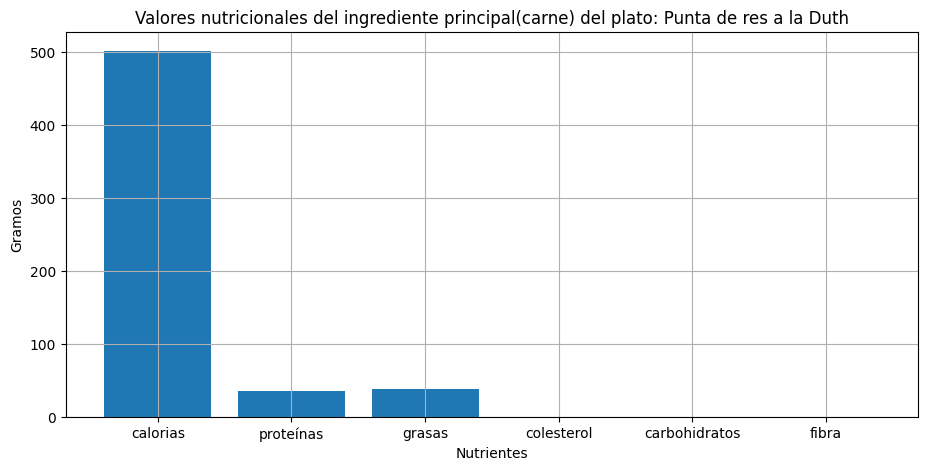

Valores nutricionales del ingrediente principal(carne) del plato Entrecote de ternera:
calorias: 878.5
proteínas: 63.7
grasas: 66.5
colesterol: 0.34
carbohidratos: 1.64
fibra: 0.0


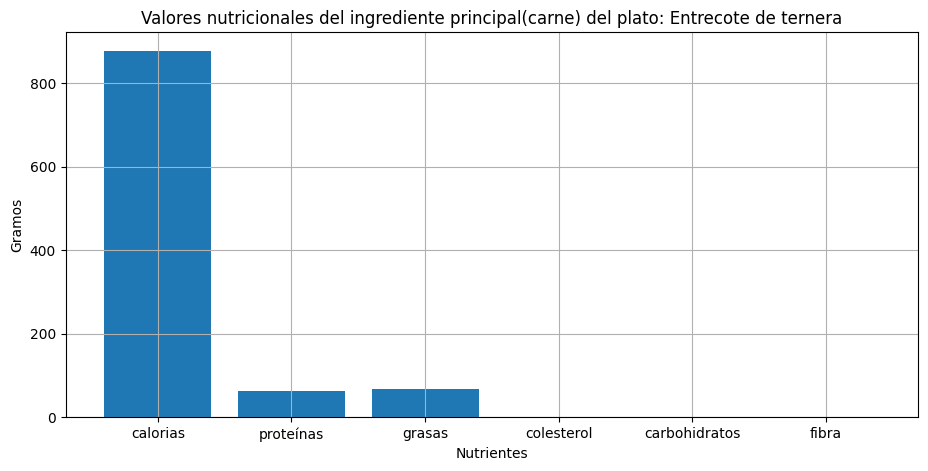

Valores nutricionales del ingrediente principal(carne) del plato Solomillo argentino:
calorias: 478.8
proteínas: 53.48
grasas: 29.4
colesterol: 0.25
carbohidratos: 0.0
fibra: 0.0


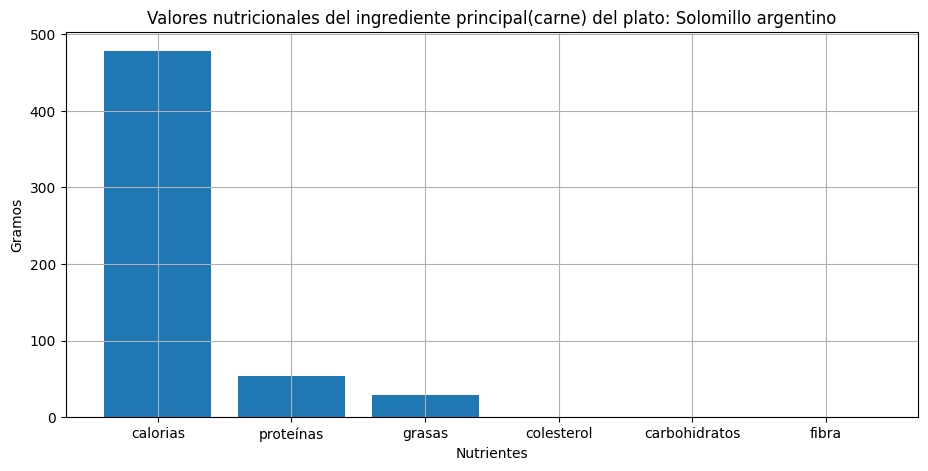

Valores nutricionales del ingrediente principal(carne) del plato Masa Frita:
calorias: 735.3
proteínas: 82.13
grasas: 45.15
colesterol: 0.38
carbohidratos: 0.0
fibra: 0.0


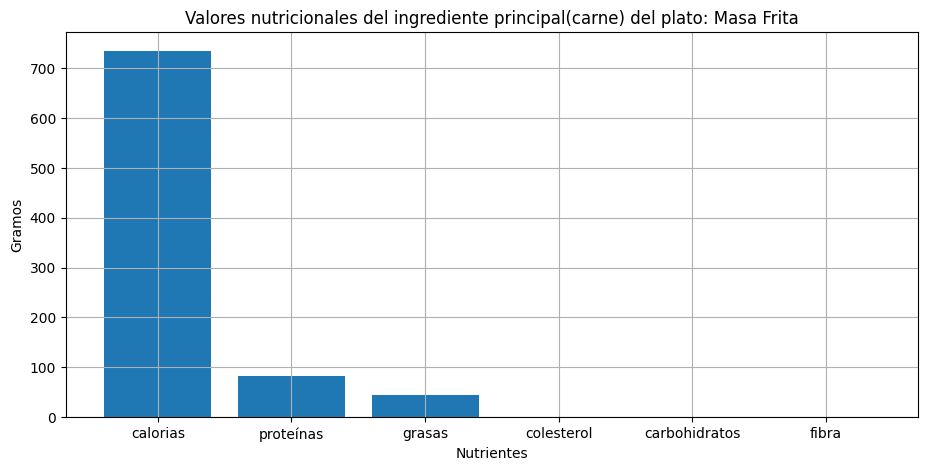

Valores nutricionales del ingrediente principal(carne) del plato Bistec de Higado:
calorias: 1154.6
proteínas: 83.72
grasas: 87.4
colesterol: 0.45
carbohidratos: 2.16
fibra: 0.0


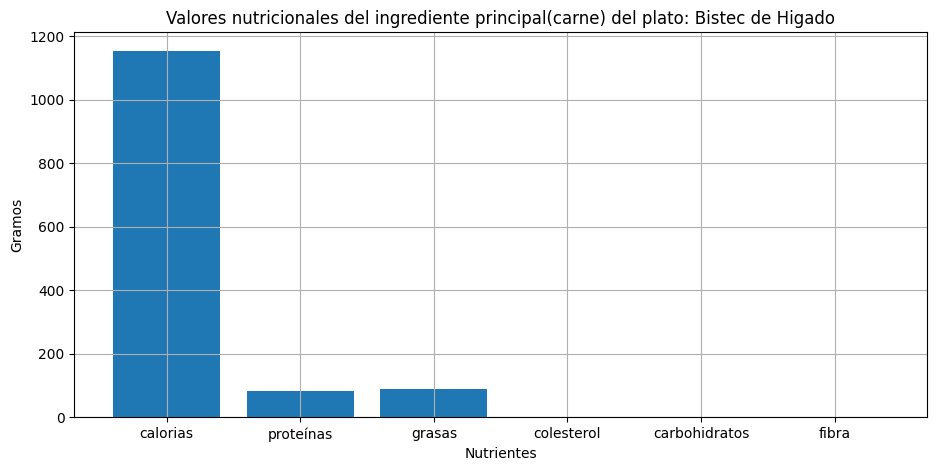

Valores nutricionales del ingrediente principal(carne) del plato Fricase de Cerdo:
calorias: 735.3
proteínas: 82.13
grasas: 45.15
colesterol: 0.38
carbohidratos: 0.0
fibra: 0.0


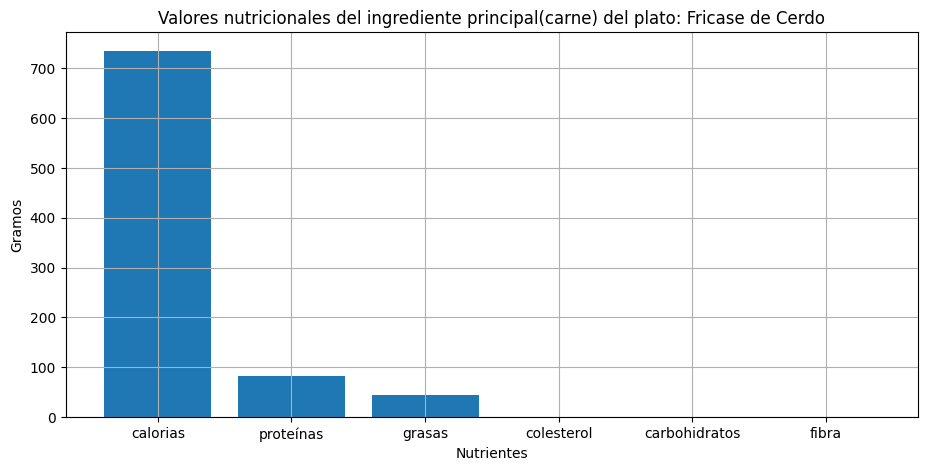

Valores nutricionales del ingrediente principal(carne) del plato Bistec de Cerdo:
calorias: 786.6
proteínas: 87.86
grasas: 48.3
colesterol: 0.41
carbohidratos: 0.0
fibra: 0.0


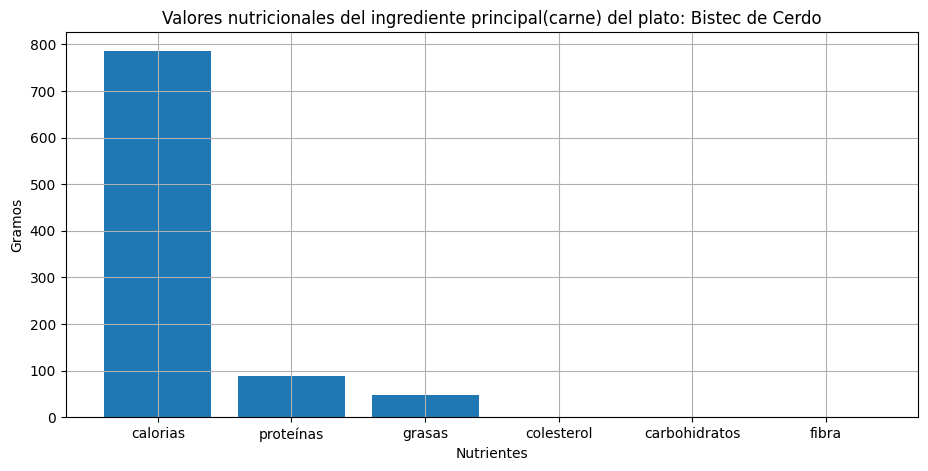

Valores nutricionales del ingrediente principal(carne) del plato Langosta Grille:
calorias: 614.1
proteínas: 131.1
grasas: 5.93
colesterol: 1.01
carbohidratos: 0.0
fibra: 0.0


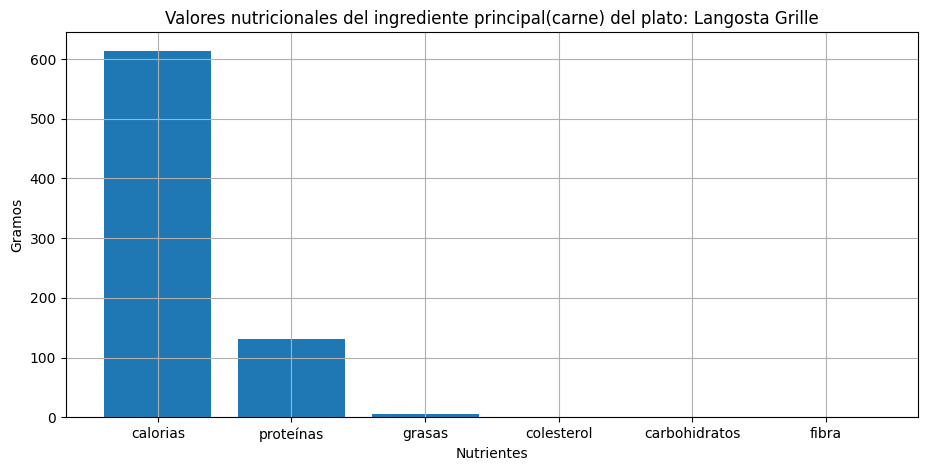

Valores nutricionales del ingrediente principal(carne) del plato Langosta Enchilada:
calorias: 614.1
proteínas: 131.1
grasas: 5.93
colesterol: 1.01
carbohidratos: 0.0
fibra: 0.0


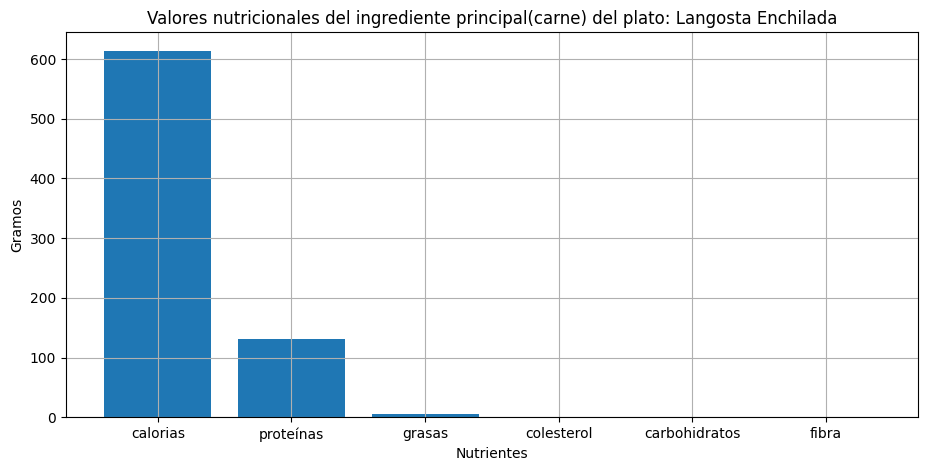

Valores nutricionales del ingrediente principal(carne) del plato Fricase de Carnero:
calorias: 2716.8
proteínas: 238.08
grasas: 188.16
colesterol: 0.93
carbohidratos: 0.0
fibra: 0.0


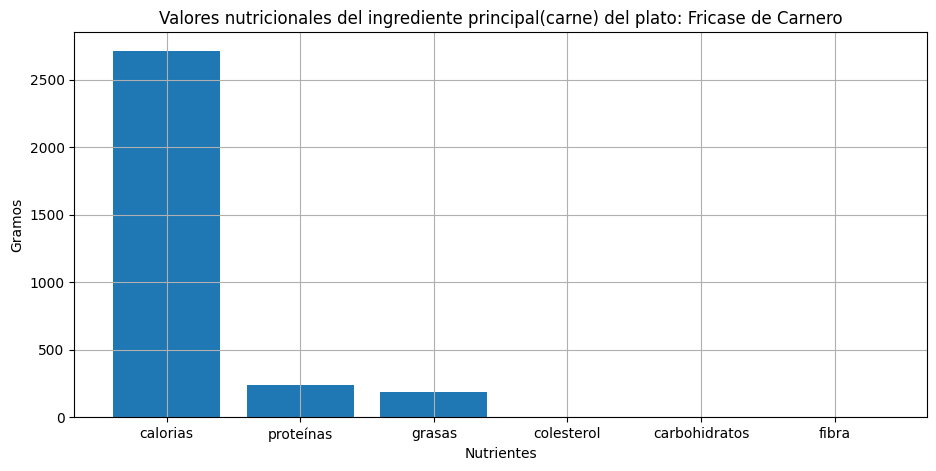

Valores nutricionales del ingrediente principal(carne) del plato Higado Italiana:
calorias: 1154.6
proteínas: 83.72
grasas: 87.4
colesterol: 0.45
carbohidratos: 2.16
fibra: 0.0


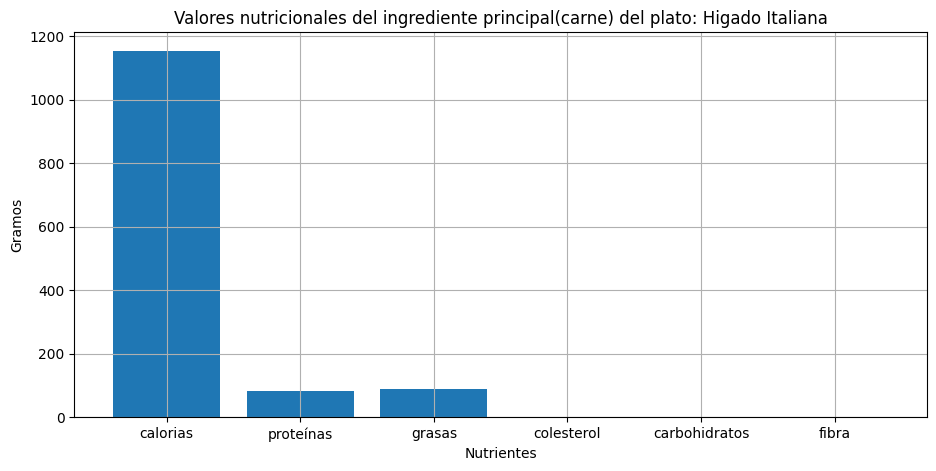

Valores nutricionales del ingrediente principal(carne) del plato Ropa Vieja:
calorias: 1154.6
proteínas: 83.72
grasas: 87.4
colesterol: 0.45
carbohidratos: 2.16
fibra: 0.0


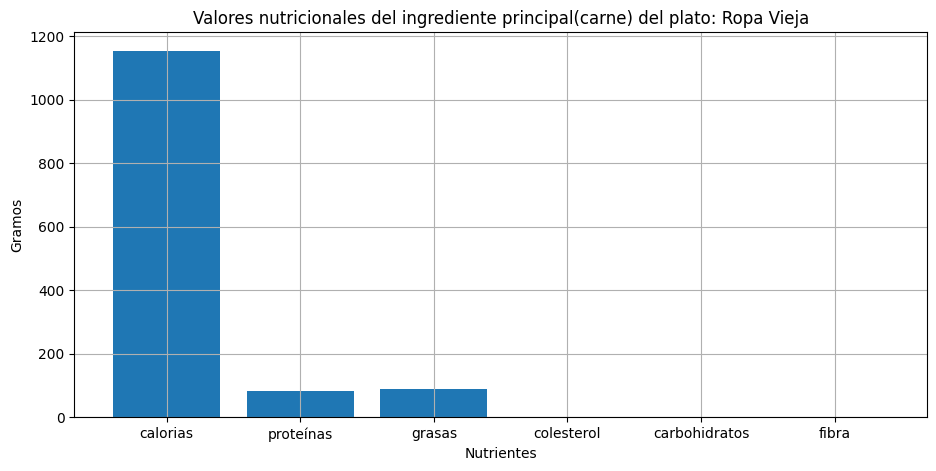

Valores nutricionales del ingrediente principal(carne) del plato Chuleta de Cerdo:
calorias: 786.6
proteínas: 87.86
grasas: 48.3
colesterol: 0.41
carbohidratos: 0.0
fibra: 0.0


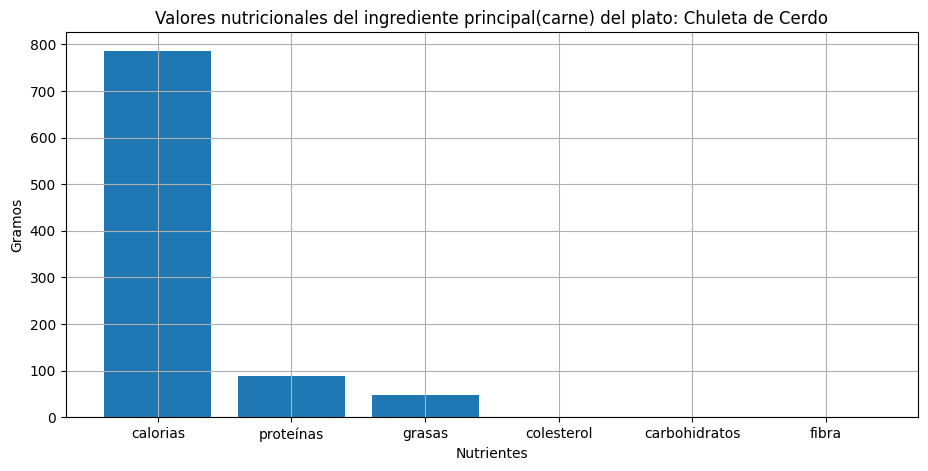

Valores nutricionales del ingrediente principal(carne) del plato FILETE DE PESCADO JOHN VILLE:
calorias: 522.1
proteínas: 25.3
grasas: 37.26
colesterol: 0.06
carbohidratos: 49.91
fibra: 3.45


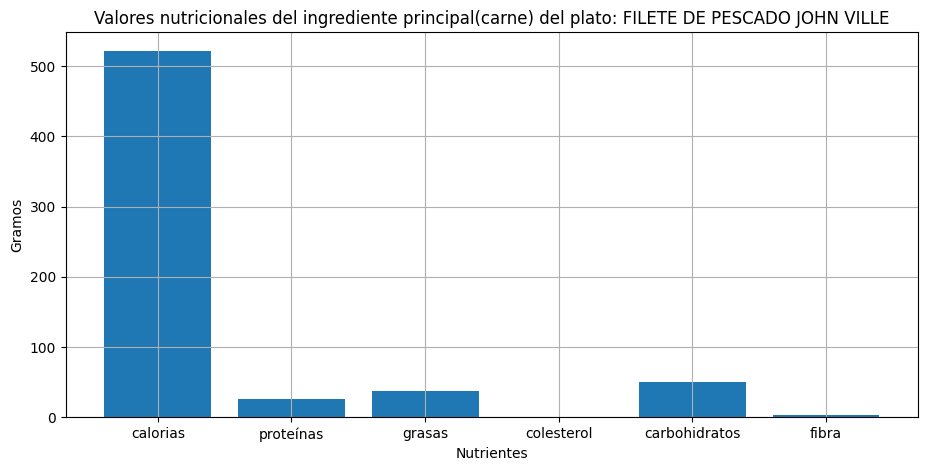

Valores nutricionales del ingrediente principal(carne) del plato BISTEC DE CERDO GRILLE:
calorias: 393.3
proteínas: 43.93
grasas: 24.15
colesterol: 0.2
carbohidratos: 0.0
fibra: 0.0


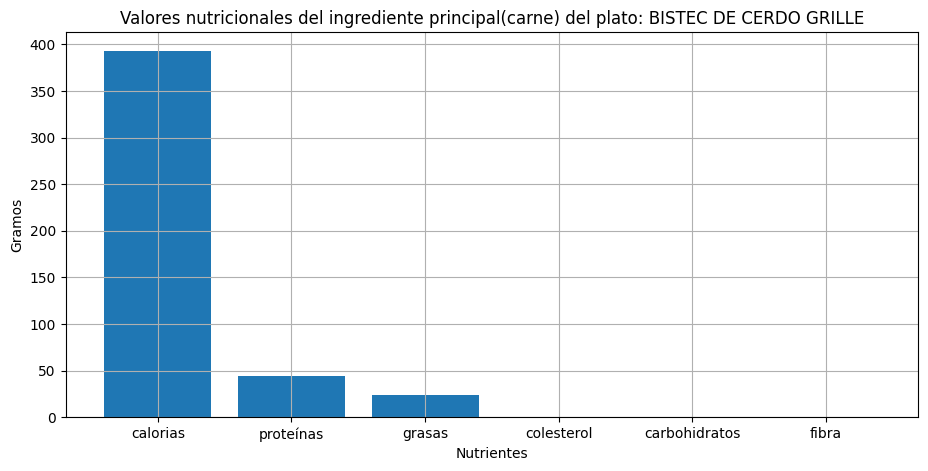

Valores nutricionales del ingrediente principal(carne) del plato FILETE PESCADO GRILLE:
calorias: 522.1
proteínas: 25.3
grasas: 37.26
colesterol: 0.06
carbohidratos: 49.91
fibra: 3.45


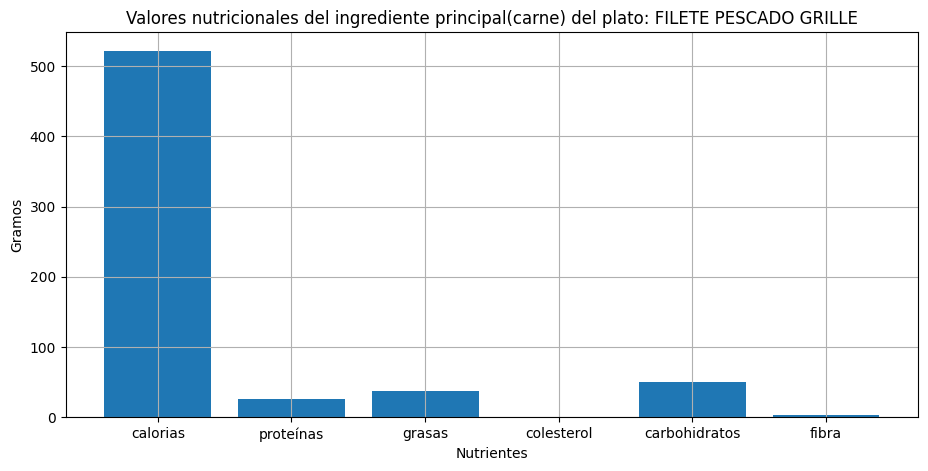

Valores nutricionales del ingrediente principal(carne) del plato FAJITAS DE POLLO SALTEADAS:
calorias: 363.4
proteínas: 41.4
grasas: 40.48
colesterol: 0.13
carbohidratos: 9.31
fibra: 0.69


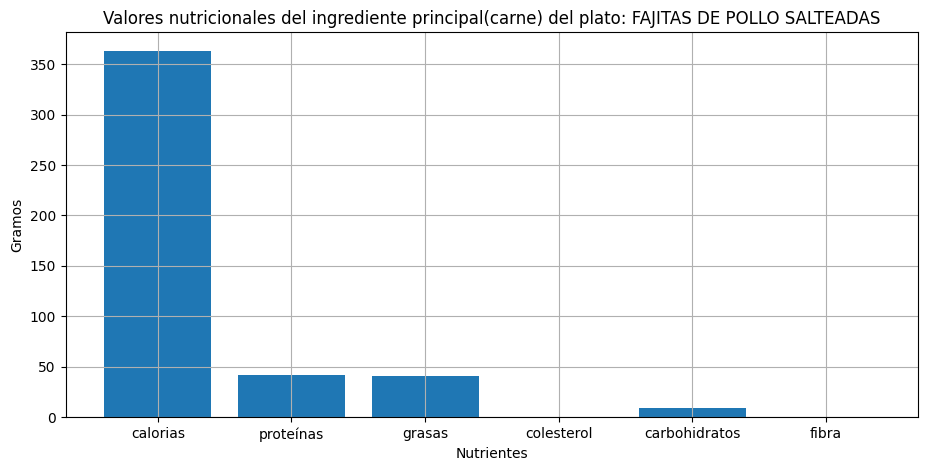

Valores nutricionales del ingrediente principal(carne) del plato MASA DE CERDO FRITA:
calorias: 342.0
proteínas: 38.2
grasas: 21.0
colesterol: 0.18
carbohidratos: 0.0
fibra: 0.0


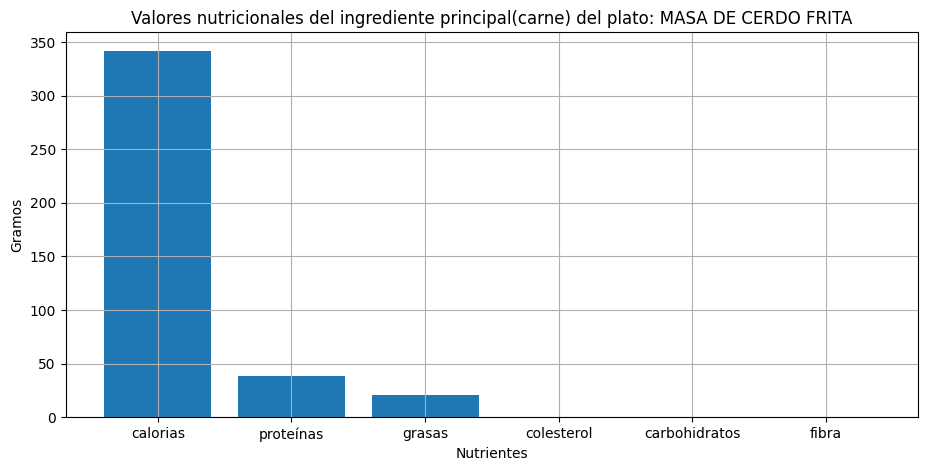

Valores nutricionales del ingrediente principal(carne) del plato BISTEC DE POLLO DESHUESADO:
calorias: 363.4
proteínas: 41.4
grasas: 40.48
colesterol: 0.13
carbohidratos: 9.31
fibra: 0.69


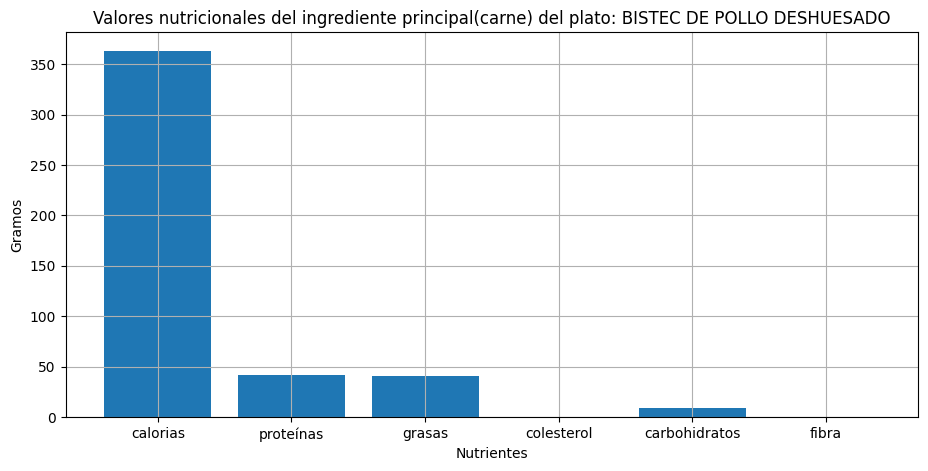

Valores nutricionales del ingrediente principal(carne) del plato PULPO AL GUSTO (GRILLLE, ENCHILADO Y AL AJILLO):
calorias: 147.6
proteínas: 26.82
grasas: 1.87
colesterol: 0.09
carbohidratos: 3.96
fibra: 0.0


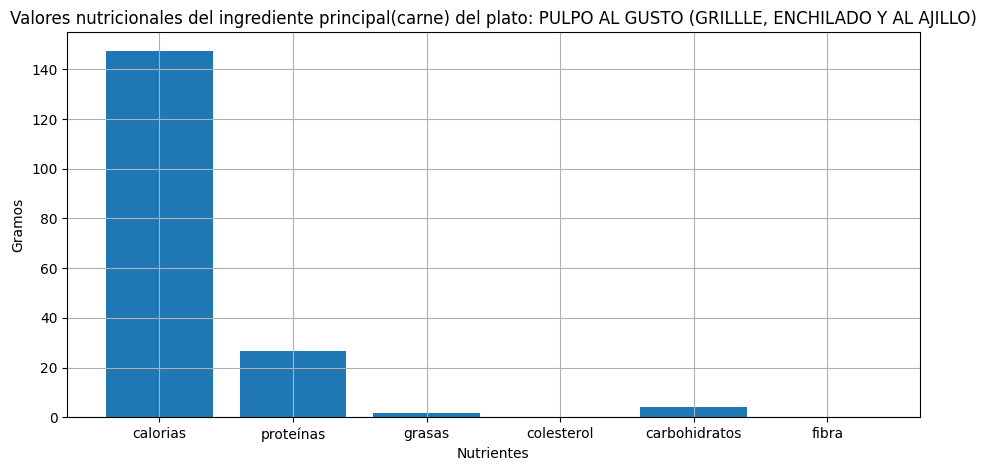

Valores nutricionales del ingrediente principal(carne) del plato ROPA VIEJA:
calorias: 376.5
proteínas: 27.3
grasas: 28.5
colesterol: 0.15
carbohidratos: 0.7
fibra: 0.0


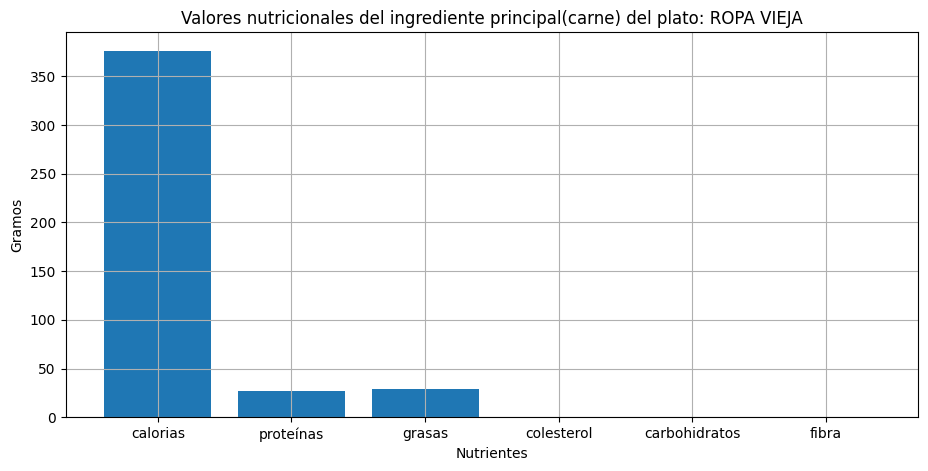

Valores nutricionales del ingrediente principal(carne) del plato FILETE DE PESCADO C/ J Y Q GRATINADO:
calorias: 522.1
proteínas: 25.3
grasas: 37.26
colesterol: 0.06
carbohidratos: 49.91
fibra: 3.45


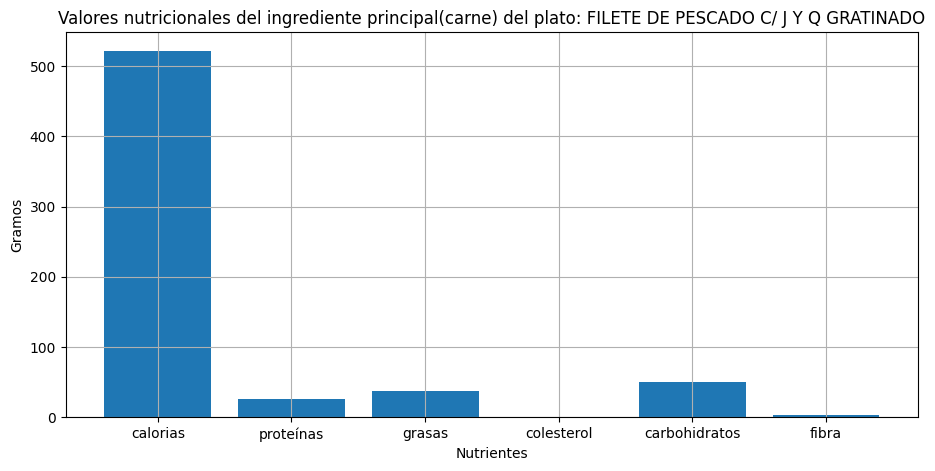

Valores nutricionales del ingrediente principal(carne) del plato VACA FRITA:
calorias: 376.5
proteínas: 27.3
grasas: 28.5
colesterol: 0.15
carbohidratos: 0.7
fibra: 0.0


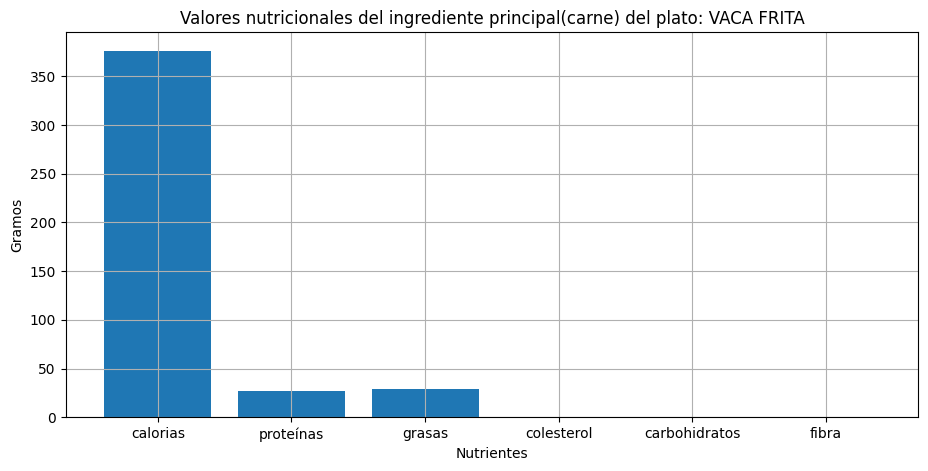

Valores nutricionales del ingrediente principal(carne) del plato PECHUGA DE POLLO GRILLE:
calorias: 363.4
proteínas: 41.4
grasas: 40.48
colesterol: 0.13
carbohidratos: 9.31
fibra: 0.69


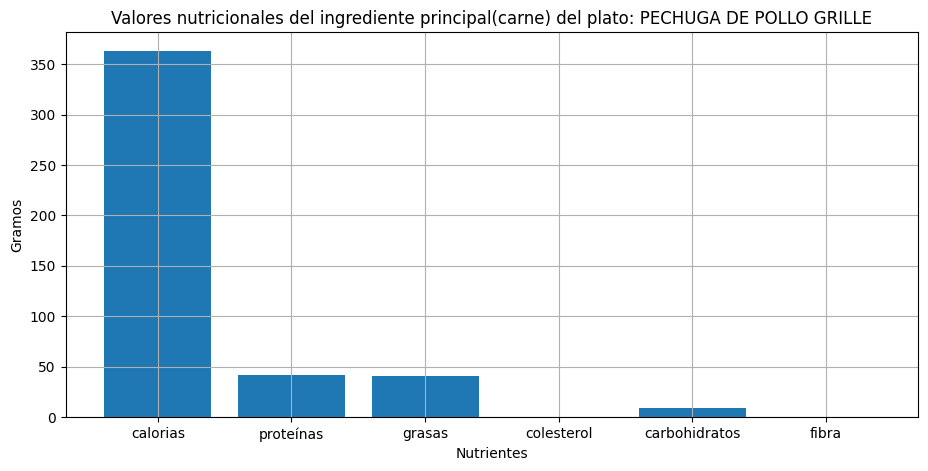

Valores nutricionales del ingrediente principal(carne) del plato POLLO A LA BARBACOA:
calorias: 180.12
proteínas: 20.52
grasas: 20.06
colesterol: 0.06
carbohidratos: 4.62
fibra: 0.34


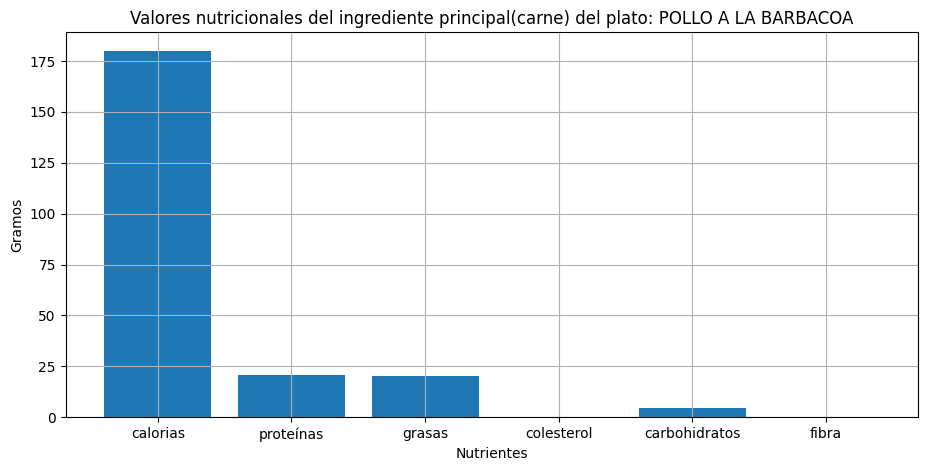

Valores nutricionales del ingrediente principal(carne) del plato POLLO ASADO:
calorias: 180.12
proteínas: 20.52
grasas: 20.06
colesterol: 0.06
carbohidratos: 4.62
fibra: 0.34


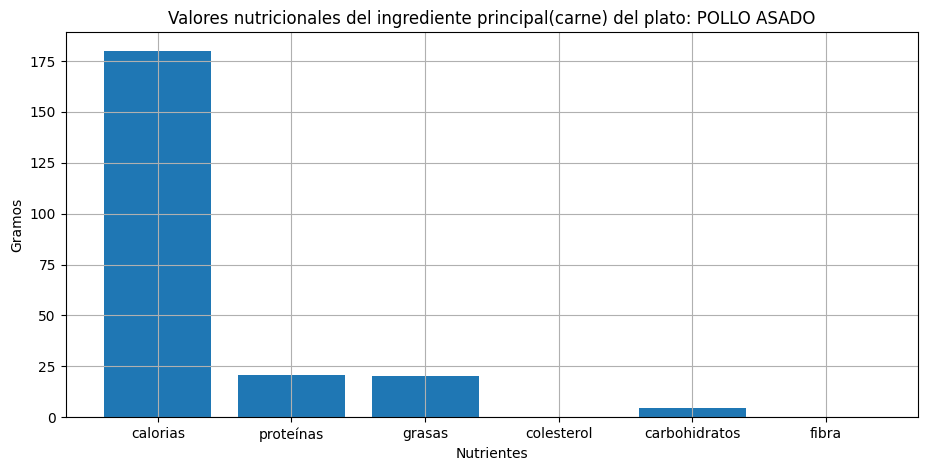

Valores nutricionales del ingrediente principal(carne) del plato POLLO CHIFLADO(SIN HUESO):
calorias: 790.0
proteínas: 90.0
grasas: 88.0
colesterol: 0.28
carbohidratos: 20.25
fibra: 1.5


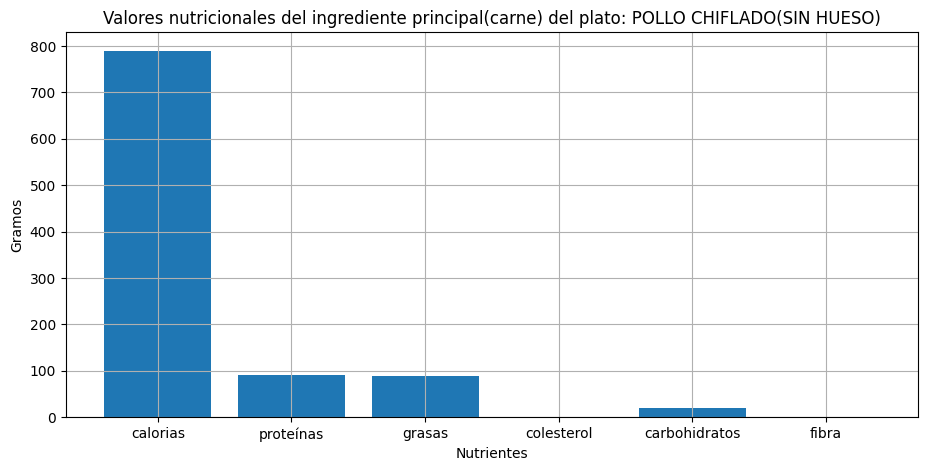

Valores nutricionales del ingrediente principal(carne) del plato Chuleta cerdo (Arroz moro y tostones):
calorias: 769.5
proteínas: 85.95
grasas: 47.25
colesterol: 0.4
carbohidratos: 0.0
fibra: 0.0


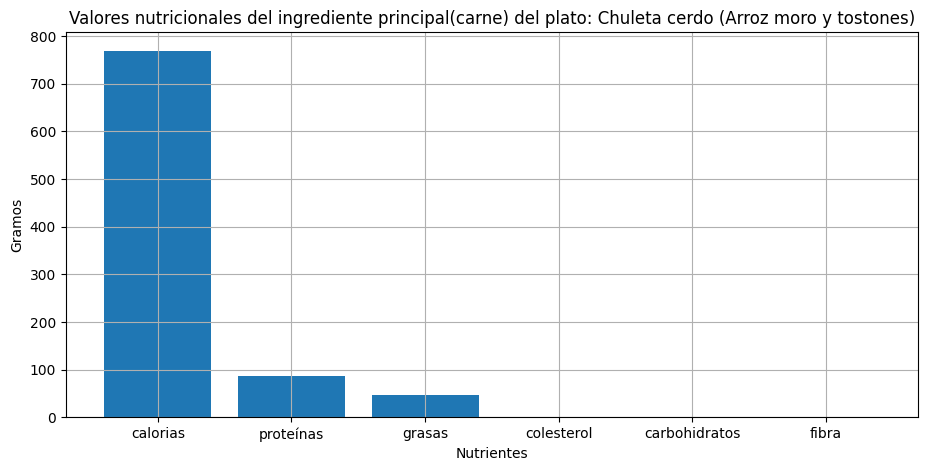

Valores nutricionales del ingrediente principal(carne) del plato Lomo de cerdo:
calorias: 598.5
proteínas: 66.85
grasas: 36.75
colesterol: 0.31
carbohidratos: 0.0
fibra: 0.0


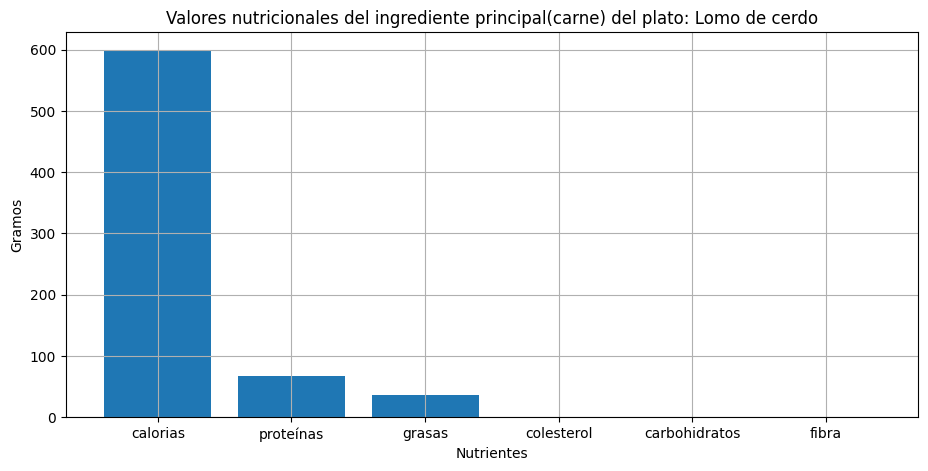

Valores nutricionales del ingrediente principal(carne) del plato Solomillo:
calorias: 786.6
proteínas: 87.86
grasas: 48.3
colesterol: 0.41
carbohidratos: 0.0
fibra: 0.0


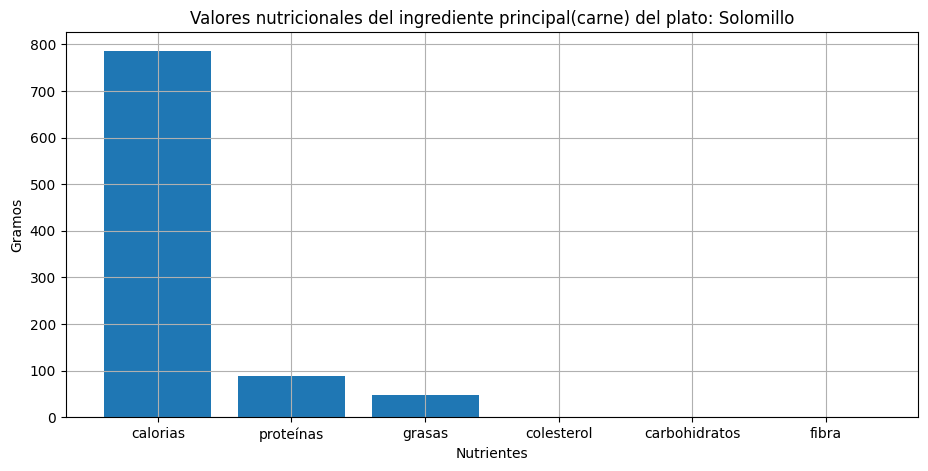

Valores nutricionales del ingrediente principal(carne) del plato Pollo asado:
calorias: 395.0
proteínas: 45.0
grasas: 44.0
colesterol: 0.14
carbohidratos: 10.12
fibra: 0.75


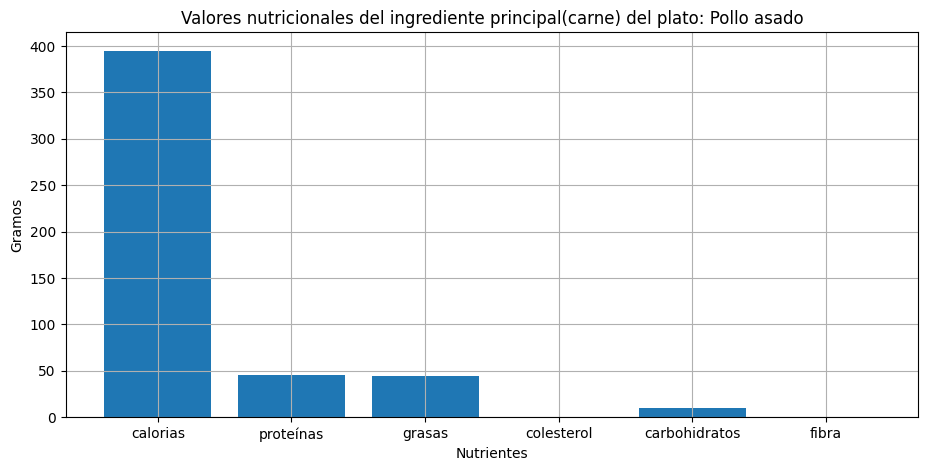

Valores nutricionales del ingrediente principal(carne) del plato Masa de cerdo frita:
calorias: 513.0
proteínas: 57.3
grasas: 31.5
colesterol: 0.27
carbohidratos: 0.0
fibra: 0.0


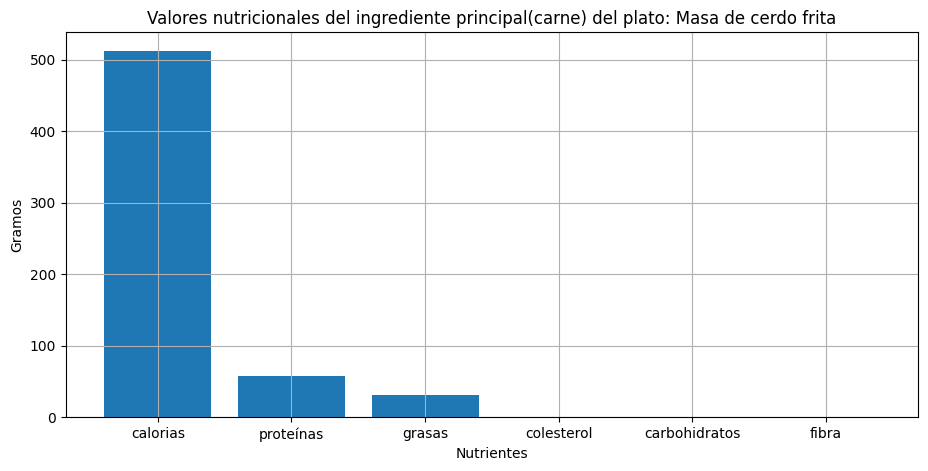

Valores nutricionales del ingrediente principal(carne) del plato Chuleta de cerdo al carbón con bbq:
calorias: 769.5
proteínas: 85.95
grasas: 47.25
colesterol: 0.4
carbohidratos: 0.0
fibra: 0.0


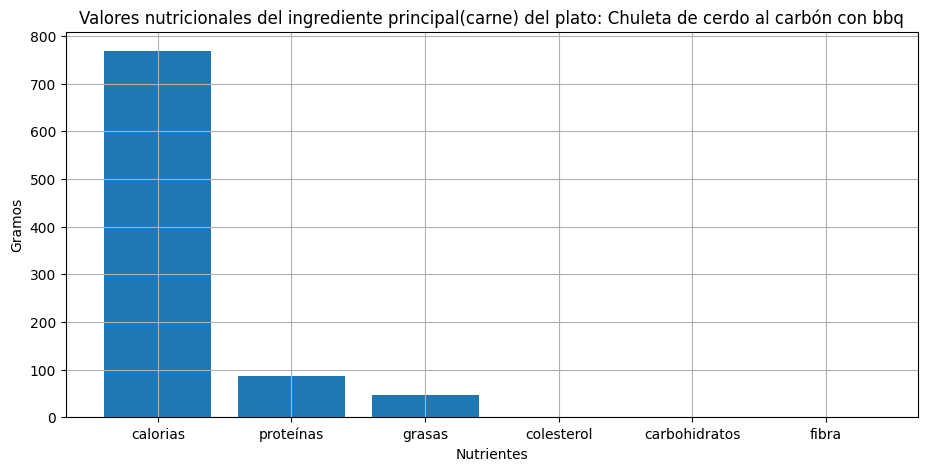

Valores nutricionales del ingrediente principal(carne) del plato Solomillo de cerdo al carbón con bbq:
calorias: 769.5
proteínas: 85.95
grasas: 47.25
colesterol: 0.4
carbohidratos: 0.0
fibra: 0.0


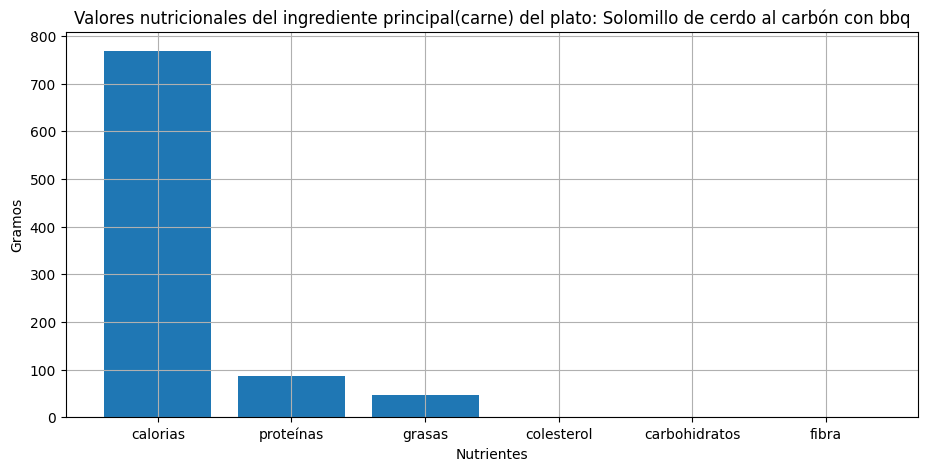

In [41]:
import os
import json
import my_library as ly
import matplotlib.pyplot as plt


with open("info_nutrientes.json", "r", encoding="utf8") as n:
    data_nutrientes = json.load(n)


ruta = "json_programa_aportes_nutricional"
archivos_json = os.listdir(ruta)
nutrientes_por_plato = {}


for archivo in archivos_json:
    with open(os.path.join(ruta, archivo), "r", encoding="utf8") as f:
        datos = json.load(f)
    if 'strong_dishes' in datos['menu'] and datos['menu']['strong_dishes'] is not None:
        strong_dishes = datos['menu']['strong_dishes']
        no = ly.coger_el_numero(strong_dishes) 
        lista_platos = ly.name_platos(strong_dishes)
        if 'name' in datos: 
            name = datos['name'] 
            print (f'{name}:{lista_platos}' )
        for nombre_plato, gramos, tipo_carne in no:
            if tipo_carne in data_nutrientes:
                if nombre_plato not in nutrientes_por_plato:
                    nutrientes_por_plato[nombre_plato] = {}
                nutrientes_plato_unico = ly.calcular_nutrientes(data_nutrientes, tipo_carne, gramos)
                for nutriente, valor in nutrientes_plato_unico.items():
                    if nutriente not in nutrientes_por_plato[nombre_plato]:
                        nutrientes_por_plato[nombre_plato][nutriente] = 0
                    nutrientes_por_plato[nombre_plato][nutriente] += valor


for plato, nutrientes in nutrientes_por_plato.items():
    print(f"Valores nutricionales del ingrediente principal(carne) del plato {plato}:")
    for nutriente, valor in nutrientes.items():
        print(f"{nutriente}: { round(valor, 2)}")
    plt.figure(figsize=(11, 5))
    plt.bar(nutrientes.keys(), nutrientes.values())
    plt.title(f'Valores nutricionales del ingrediente principal(carne) del plato: {plato}')
    plt.xlabel('Nutrientes')
    plt.ylabel('Gramos')
    plt.xticks(rotation=360)
    plt.grid(True)
    plt.show()

Casa Mia:['Punta de res a la Duth', 'Arracera', 'Filete Tenderloing', 'T bone con papas asadas al romero y salsa de queso azul']
ChaChaCha:['Solomillo argentino', 'Entrecote de ternera']
Comida Criolla Ocho Vías:['Bistec de Higado', 'Higado Italiana', 'Bistec de Cerdo', 'Chuleta de Cerdo', 'Fricase de Cerdo', 'Masa Frita', 'Fricase de Carnero', 'Ropa Vieja', 'Langosta Grille', 'Langosta Enchilada']
El Farallon:['FILETE PESCADO GRILLE', 'FILETE DE PESCADO C/ J Y Q GRATINADO', 'FILETE DE PESCADO JOHN VILLE', 'CAMARÓN AL GUSTO (GRILLLE, ENCHILADO Y AL AJILLO)', 'PULPO AL GUSTO (GRILLLE, ENCHILADO Y AL AJILLO)', 'ROPA VIEJA', 'VACA FRITA', 'BISTEC DE CERDO GRILLE', 'MASA DE CERDO FRITA', 'PECHUGA DE POLLO GRILLE', 'FAJITAS DE POLLO SALTEADAS', 'BISTEC DE POLLO DESHUESADO', 'POLLO A LA BARBACOA', 'POLLO ASADO']
Heredia:['POLLO CHIFLADO(SIN HUESO)']
Lateral:['Solomillo', 'Lomo de cerdo', 'Chuleta cerdo (Arroz moro y tostones)']
Pasos Habaneros:['Pollo asado']
Cafe Versalles:['Chuleta de cerd

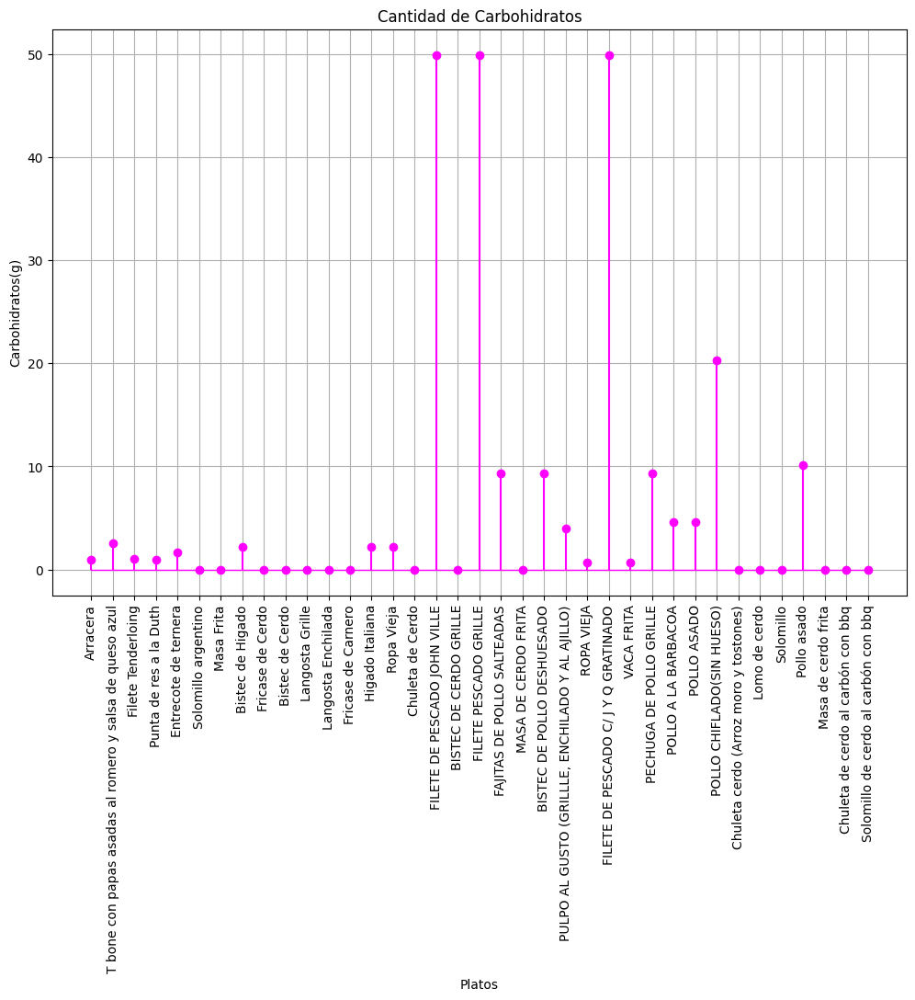

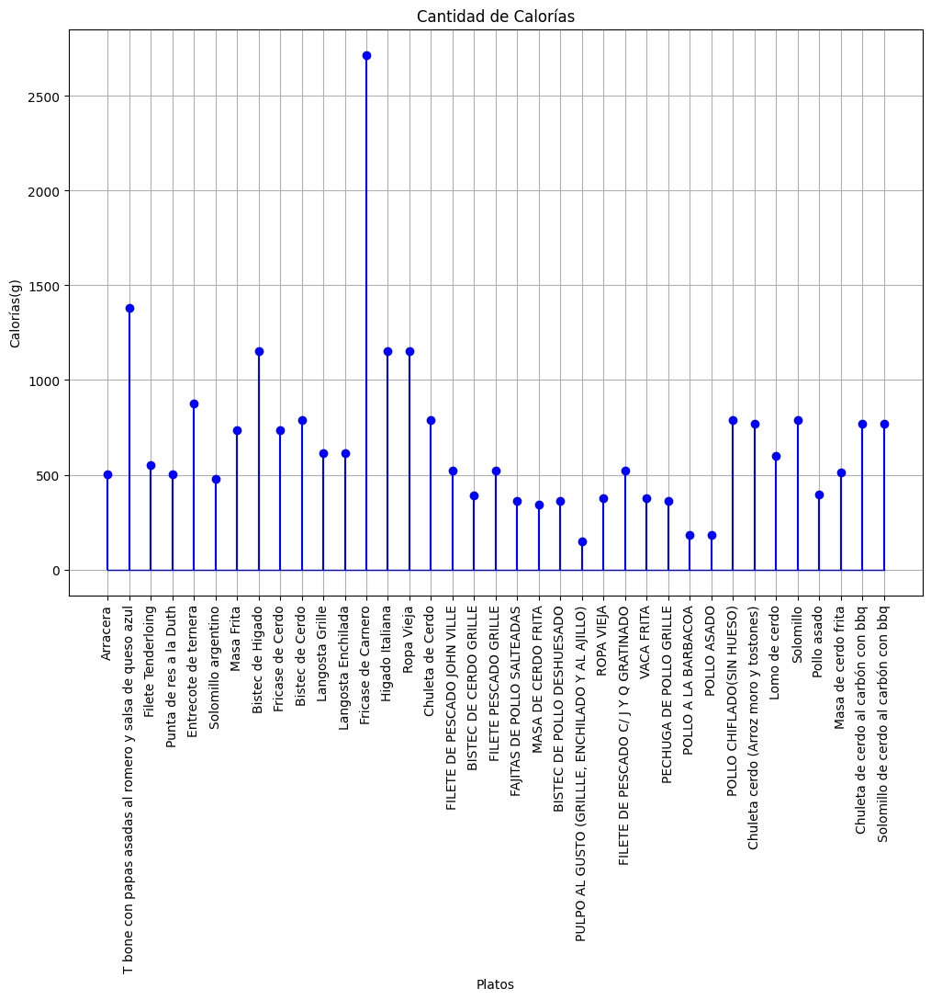

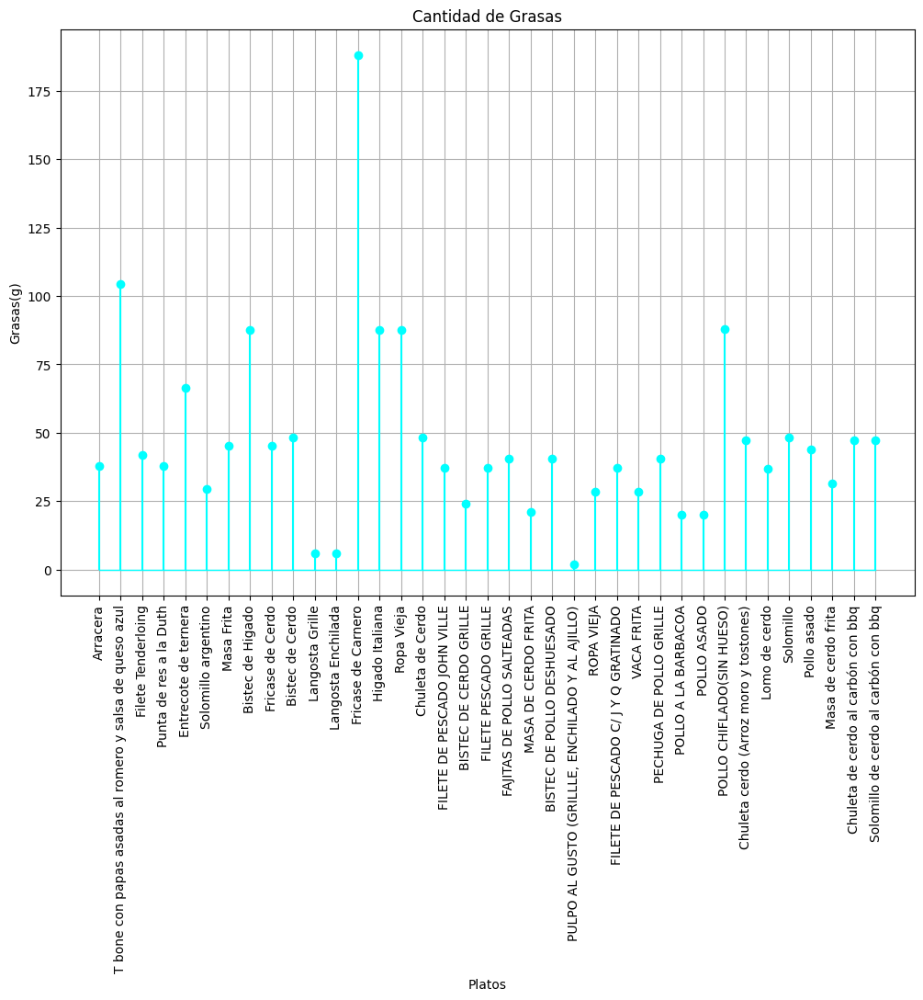

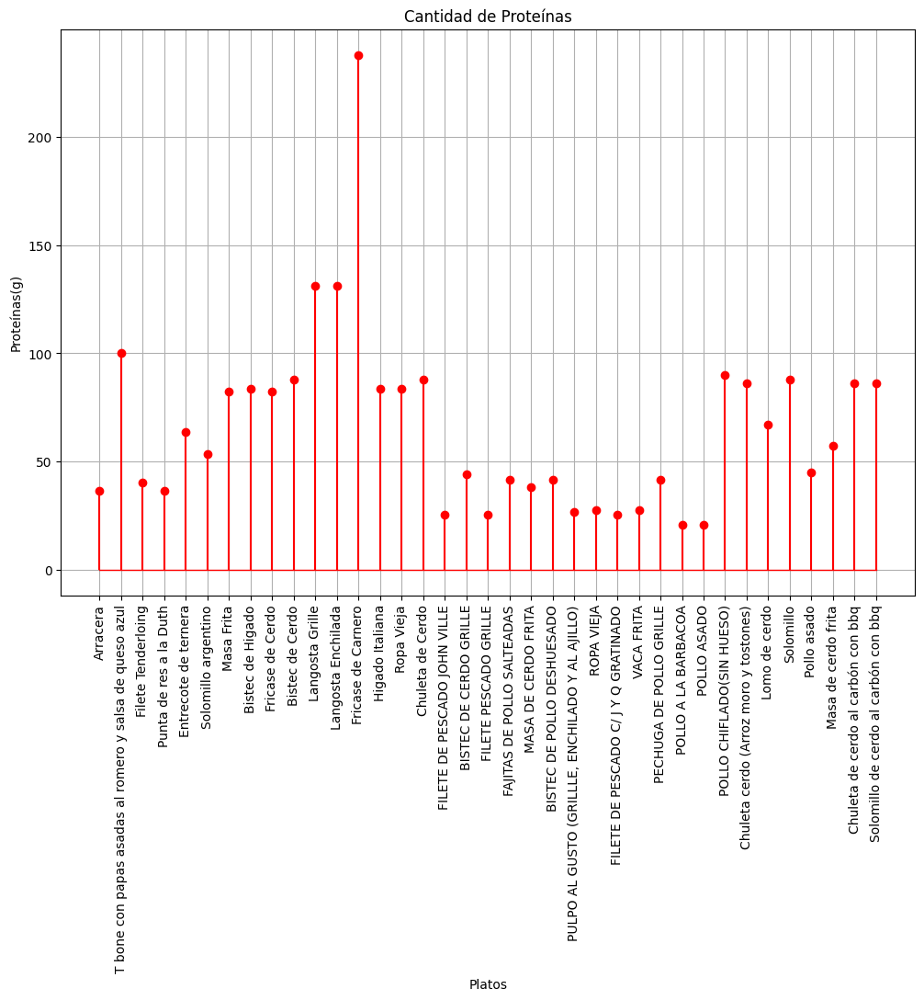

In [120]:
import os
import json
import my_library as ly
import matplotlib.pyplot as plt


with open("info_nutrientes.json", "r", encoding="utf8") as n:
    data_nutrientes = json.load(n)


ruta = "json_programa_aportes_nutricional"
archivos_json = os.listdir(ruta)
nutrientes_por_plato = {}


for archivo in archivos_json:
    with open(os.path.join(ruta, archivo), "r", encoding="utf8") as f:
        datos = json.load(f)
    if 'strong_dishes' in datos['menu'] and datos['menu']['strong_dishes'] is not None:
        strong_dishes = datos['menu']['strong_dishes']
        no = ly.coger_el_numero(strong_dishes)
        lista_platos = ly.name_platos(strong_dishes)
        if 'name' in datos:
            name = datos['name']
            print(f'{name}:{lista_platos}')
        for nombre_plato, gramos, tipo_carne in no:
            if tipo_carne in data_nutrientes:
                if nombre_plato not in nutrientes_por_plato:
                    nutrientes_por_plato[nombre_plato] = {}
                nutrientes_plato_unico = ly.calcular_nutrientes(data_nutrientes, tipo_carne, gramos)
                for nutriente, valor in nutrientes_plato_unico.items():
                    if nutriente not in nutrientes_por_plato[nombre_plato]:
                        nutrientes_por_plato[nombre_plato][nutriente] = 0
                    nutrientes_por_plato[nombre_plato][nutriente] += valor


platos = list(nutrientes_por_plato.keys())
proteinas = [nutrientes_por_plato[plato].get('proteínas') for plato in platos]
calorias = [nutrientes_por_plato[plato].get('calorias') for plato in platos]
carbohidratos = [nutrientes_por_plato[plato].get('carbohidratos') for plato in platos]
grasas = [nutrientes_por_plato[plato].get('grasas') for plato in platos]

# grafica carbohidratos
plt.figure(figsize=(12, 8))
markerline, stemlines, baseline = plt.stem(platos, carbohidratos, linefmt='-', basefmt='-', markerfmt='o')
plt.setp(stemlines, 'color', 'magenta')
plt.setp(markerline, 'color', 'magenta')
plt.setp(baseline, 'color', 'magenta', 'linewidth', 1)
plt.title('Cantidad de Carbohidratos')
plt.xlabel('Platos')
plt.ylabel('Carbohidratos(g)')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

#grafica calorias
plt.figure(figsize=(12, 8))
markerline, stemlines, baseline = plt.stem(platos, calorias, linefmt='-', basefmt='-', markerfmt='o')
plt.setp(stemlines, 'color', 'blue')
plt.setp(markerline, 'color', 'blue')
plt.setp(baseline, 'color', 'blue', 'linewidth', 1)
plt.title('Cantidad de Calorías')
plt.xlabel('Platos')
plt.ylabel('Calorías(g)')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

# grafica grasas
plt.figure(figsize=(12, 8))
markerline, stemlines, baseline = plt.stem(platos, grasas, linefmt='-', basefmt='-', markerfmt='o')
plt.setp(stemlines, 'color', 'cyan')
plt.setp(markerline, 'color', 'cyan')
plt.setp(baseline, 'color', 'cyan', 'linewidth', 1)
plt.title('Cantidad de Grasas')
plt.xlabel('Platos')
plt.ylabel('Grasas(g)')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

# grafica proteinas
plt.figure(figsize=(12, 8))
markerline, stemlines, baseline = plt.stem(platos, proteinas, linefmt='-', basefmt='-', markerfmt='o')
plt.setp(stemlines, 'color', 'red')
plt.setp(markerline, 'color', 'red')
plt.setp(baseline, 'color', 'red', 'linewidth', 1)
plt.title('Cantidad de Proteínas')
plt.xlabel('Platos')
plt.ylabel('Proteínas(g)')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()


codigo donde se muestran los restaurantes en las calles principales de la habana, hacer grafica donde se muestre

Obispo: ['Berkana', 'El Balcon de los Hermanos', 'El floridita', 'Europa', 'La Caribeña', 'La_Terraza_del_Obispo', 'Obispo 510', 'Restaurante_Europa']
Avenida 23: ['7 Mares', 'Sport Bar']
Malecon: ['Cafe Bohemio']
Paseo: ['Café D la Esquina', 'Los Nardos']


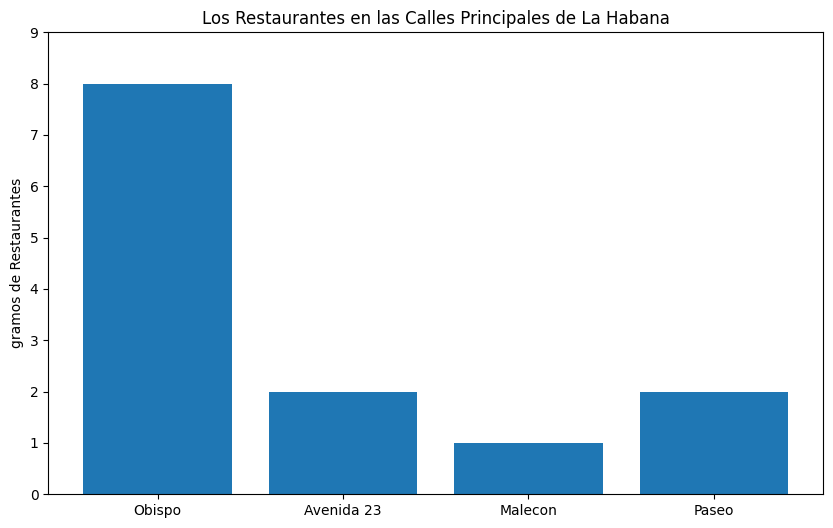

In [121]:
import json
import os
import matplotlib.pyplot as plt

ruta_carpeta = 'json'
archivos_json = os.listdir(ruta_carpeta)

obispo = []
avenida_23 = []
malecon = []
paseo = []

for archivo in archivos_json:
    with open(os.path.join(ruta_carpeta, archivo), "r", encoding="utf8") as f:
        datos = json.load(f)
        name = datos.get('name')
        location = datos.get('location')
        address = location.get('address') if location else None
        calle = address.get('Street1') if address else None
        if name and calle:
            if calle == 'Obispo':
                obispo.append(name)
            elif calle == 'Avenida 23':
                avenida_23.append(name)
            elif calle == 'Malecon':
                malecon.append(name)
            elif calle == 'Paseo':
                paseo.append(name)

print(f'Obispo: {obispo}')
print(f'Avenida 23: {avenida_23}')
print(f'Malecon: {malecon}')
print(f'Paseo: {paseo}')

calle_obispo = len(obispo)
calle_23 = len(avenida_23)
calle_malecon = len(malecon)
calle_paseo = len(paseo)
callesss = ['Obispo','Avenida 23','Malecon', 'Paseo']
gramos_restaurantes = [calle_obispo,calle_23,calle_malecon,calle_paseo]
plt.figure(figsize=(10, 6))
plt.bar(callesss, gramos_restaurantes)
plt.xticks(rotation=360)  
plt.yticks(range(0, max(gramos_restaurantes) + 2))
plt.ylabel('gramos de Restaurantes')
plt.title('Los Restaurantes en las Calles Principales de La Habana')
plt.show()

promedios

Precio promedio de la pizza por municipio
plaza de la revolucion: 1596
regla: 1150
habana vieja: 1850
marianao: 1253
boyeros: 1280
habana del este: 1461
playa: 2045
guanabacoa: 1076
arroyo naranjo: 1381
san miguel del padron: 761
centro habana: 1895
cotorro: 1053
10 de octubre: 1561
cerro: 928
la lisa: 1196


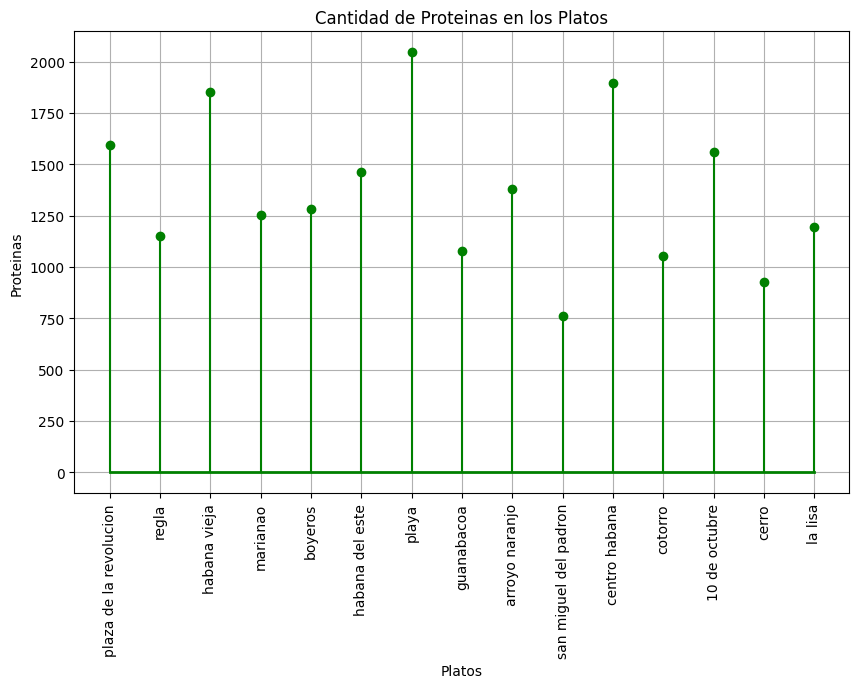

In [122]:
import json
import os
import my_library as ly
import matplotlib.pyplot as plt
import numpy as np


ruta_carpeta = 'json'
archivos_json = os.listdir(ruta_carpeta)
pizzas_precios = {}

for archivo in archivos_json:
    with open(os.path.join(ruta_carpeta, archivo), "r", encoding="utf8") as f:
        datos = json.load(f)
        if "municipality" in datos:
            municipio = datos["municipality"].strip().lower() 
        else:
            municipio = None
        if "menu" in datos and "pizzas" in datos["menu"]:
            pizzas = datos['menu']['pizzas']
        else:
            pizzas = None
        if municipio and pizzas:
            if municipio not in pizzas_precios:
                pizzas_precios[municipio] = ly.valor_num(pizzas)
            else:
                pizzas_precios[municipio].extend(ly.valor_num(pizzas))

pizzas_promedio = {}
print("Precio promedio de la pizza por municipio")
for municipio in pizzas_precios:
    promedio = ly.promedio(pizzas_precios,municipio)
    pizzas_promedio[municipio] = promedio
    print(f"{municipio}: {promedio}")

nombres_municipio = list(pizzas_promedio.keys())
promedios= list(pizzas_promedio.values())


plt.figure(figsize=(10, 6))
markerline, stemlines, baseline = plt.stem(nombres_municipio, promedios, linefmt='-', basefmt='-', markerfmt='o')
plt.setp(stemlines, 'color', 'green') 
plt.setp(markerline, 'color', 'green')  
plt.setp(baseline, 'color', 'green', 'linewidth', 2)  
plt.title('Cantidad de Proteinas en los Platos')
plt.xlabel('Platos')
plt.ylabel('Proteinas')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()
